# **Data Visualization with Python**

# Part 6_Maps

#### Author: Avery Jan

#### Date: 3-25-2023

# Overview
This part of the project focuses on creating maps for different objectives. The primary plotting library used in this part is Folium. Folium was  developed for the sole purpose of visualizing geospatial data. Other than basic map, Stamen Toner map, and Stamen Terrain map that centered at a specified location, a dataset about the crimes in San Francisco is used to create a map that has markers to indicate the locations of the crimes. In addition, the same Canada immigration dataset used in previous parts is used to create a Choropleth map that shows the total number of immigrants from various countries to Canada from 1980 to 2013. In addition to Folium, NumPy and Panda are used for data wrangling, analysis, and part of creating the choropleth map. The visualizations generated in this part are:
1. Basic Map of Mexico
2. Stamen Toner Map of the world centered around Canada 
3. Stamen Terrain Map of Mexico
4. Maps with Markers (markers: non-clustered or clustered) of San Francisco showing 100 crimes committed there in 2016
5. Choropleth Map of the world depicting immigration from various countries to Canada, 1980 - 2013

**Note:**
The .png file of each map is attached following the code in case the platform where the project is stored does not display the maps properly.

# Datasets: 

## 1. Immigration to Canada from 1980 to 2013 <a id="0"></a>

Dataset Source: International migration flows to and from selected countries - The 2015 revision.

The dataset contains annual data on the flows of international immigrants as recorded by the countries of destination. The data presents both inflows and outflows according to the place of birth, citizenship or place of previous/next residence both for foreigners and nationals. This version of the dataset presents data pertaining to 45 countries of destination.

The Choropleth Maps section uses the Canada subset that includes data on immigration to Canada from 1980 to 2013. https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/Canada.xlsx

## 2. San Francisco Police Department Incidents for the year 2016

This dataset is used in the Maps with Markers section. The dataset includes the Police Department Incidents from San Francisco public data portal. The incidents were derived from San Francisco Police Department (SFPD) Crime Incident Reporting system. The dataset contains data for the entire year of 2016. Address and location has been anonymized by moving to mid-block or to an intersection. https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/Police_Department_Incidents_-_Previous_Year__2016_.csv

***
<br>

# Importing Modules <a id="2"></a>


In [1]:
# Install openpyxl (formerly xlrd), a module that pandas requires to read Excel files.

import piplite

await piplite.install(['openpyxl==3.0.9', 'folium'])

In [2]:
# Import Primary Modules

import numpy as np  
import pandas as pd 

In [3]:
# Import Folium.

import folium

print('Folium installed and imported!')

Folium installed and imported!


# 1. Basic Maps

In [4]:
# Create a map of Mexico with a zoom level of 4.

# Define Mexico's geolocation coordinates.
mexico_latitude = 23.6345 
mexico_longitude = -102.5528

# Define the world map centered around Mexico with a low zoom level.
mexico_map = folium.Map(location=[mexico_latitude, mexico_longitude], zoom_start=4)

# Display the map.
mexico_map

<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

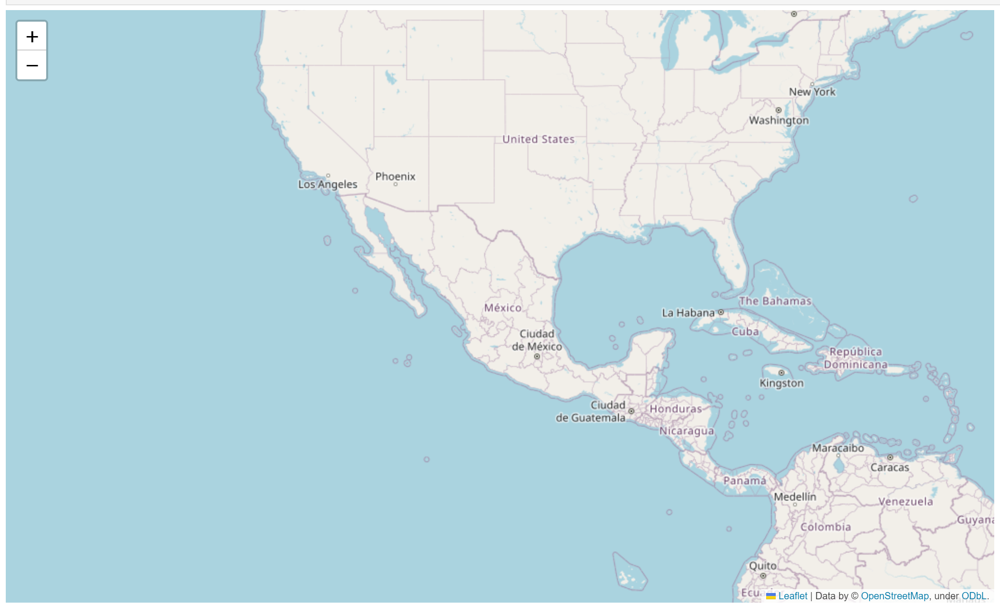
<br>

# 2. Stamen Toner Maps

In [5]:
# Create a Stamen Toner map of the world centered around Canada with a zoom level of 4.
world_map = folium.Map(location=[56.130, -106.35], zoom_start=4, tiles='Stamen Toner')

# Display map
world_map

<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

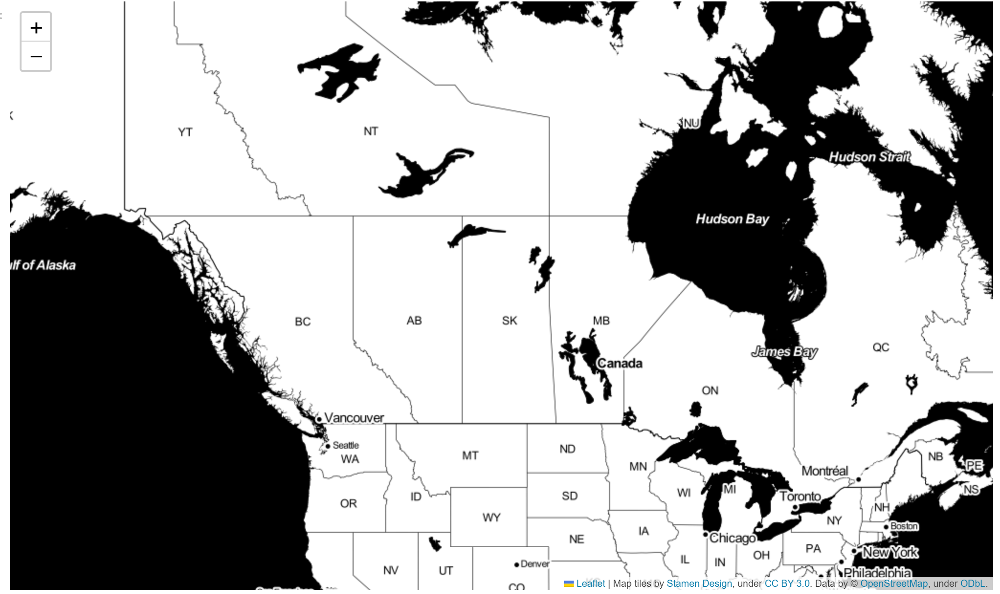
<br>

# 3. Stamen Terrain Maps

In [6]:
# Create a map of Mexico to visualize its hill shading and natural vegetation with zoom level 6.

# Define Mexico's geolocation coordinates
mexico_latitude = 23.6345 
mexico_longitude = -102.5528

# Define the world map centered around Canada with a higher zoom level
mexico_map = folium.Map(location=[mexico_latitude, mexico_longitude], zoom_start=6, tiles='Stamen Terrain')

# Display world map
mexico_map

<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

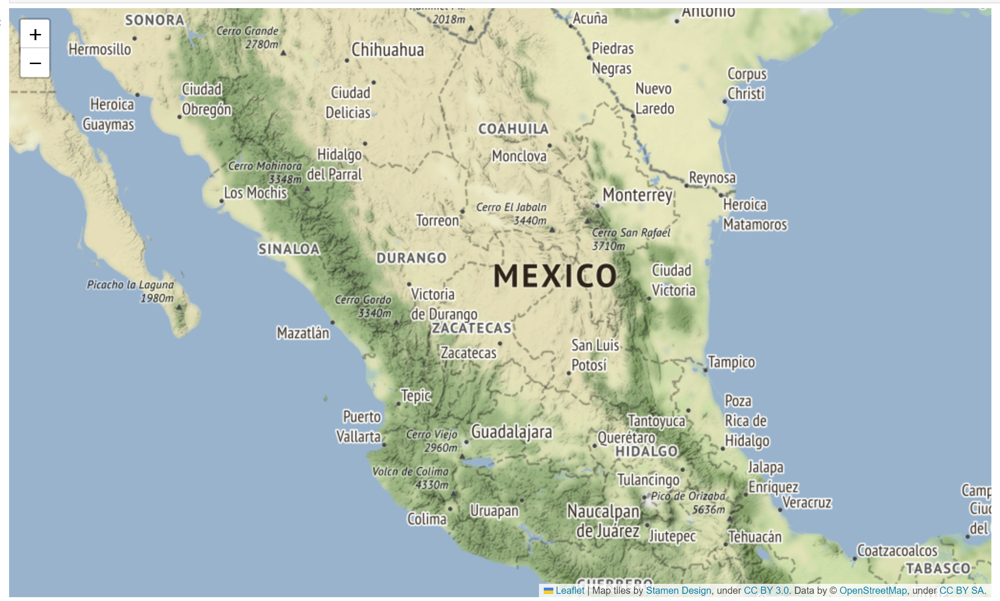

<br>

# 4. Maps with Markers <a id="6"></a>


In [7]:
# Step 1: Download the San Francisco Police Department Incidents dataset and read it into a pandas dataframe.

from js import fetch
import io

URL = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/\
Police_Department_Incidents_-_Previous_Year__2016_.csv'
resp = await fetch(URL)
text = io.BytesIO((await resp.arrayBuffer()).to_py())

df_incidents =  pd.read_csv(text)

print('Dataset downloaded and read into a pandas dataframe!')

Dataset downloaded and read into a pandas dataframe!


In [8]:
# View the first five rows of the dataframe. 
df_incidents.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


### Notes

In the df_incidents dataframe, each row consists of 13 features:

> 1.  **IncidntNum**: Incident Number
> 2.  **Category**: Category of crime or incident
> 3.  **Descript**: Description of the crime or incident
> 4.  **DayOfWeek**: The day of week on which the incident occurred
> 5.  **Date**: The Date on which the incident occurred
> 6.  **Time**: The time of day on which the incident occurred
> 7.  **PdDistrict**: The police department district
> 8.  **Resolution**: The resolution of the crime in terms whether the perpetrator was arrested or not
> 9.  **Address**: The closest address to where the incident took place
> 10. **X**: The longitude value of the crime location
> 11. **Y**: The latitude value of the crime location
> 12. **Location**: A tuple of the latitude and the longitude values
> 13. **PdId**: The police department ID


In [9]:
# Get the dimensions of the dataframe.
df_incidents.shape

(150500, 13)

In [10]:
# Get the first 100 crimes in the df_incidents dataframe to work with. 
limit = 100
df_incidents = df_incidents.iloc[0:limit, :]

In [11]:
# Confirm that the dataframe now consists of 100 crimes only.
df_incidents.shape

(100, 13)

In [12]:
# Goal: Visualize where the first 100 crimes took place in the city of San Francisco.

# Step 1: Get San Francisco latitude and longitude values.
latitude = 37.77
longitude = -122.42

# Step 2: Create a map of San Francisco with a zoom level of 12.

## Create the map of San Francisco. 
sanfran_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# Step 3: Create a 'feature group' representing the locations of the incidents. 
## Instantiate a feature group for the incidents in the dataframe.
incidents = folium.map.FeatureGroup()
## Loop through the 100 crimes and add each to the incidents feature group.
for lat, lng, in zip(df_incidents.Y, df_incidents.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # Define how big the circle markers is going to be.
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# Step 4: Add pop-up text to each marker on the map.
latitudes = list(df_incidents.Y)
longitudes = list(df_incidents.X)
labels = list(df_incidents.Category)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(sanfran_map)    
    
# Step 5: Add incidents to map.
sanfran_map.add_child(incidents)

## Now, when hoverng over a marker, the category of the crime is displayed.

<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

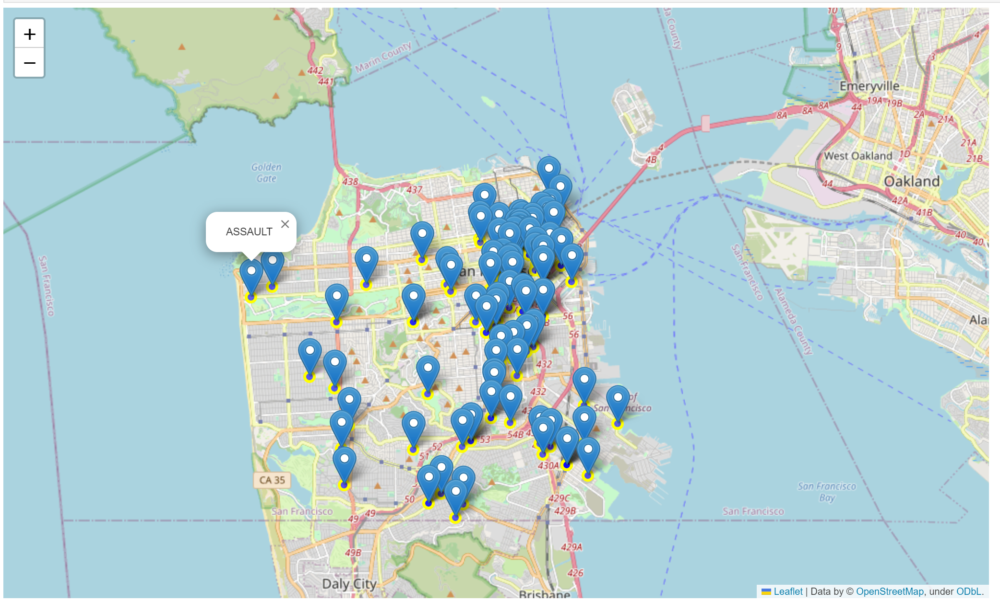
<br>

<br>
<br>

In [13]:
# Goal: Group the markers into different clusters to avoid clutter. 

# Step 1: Import plugins.
from folium import plugins

# Step 2: Create the map of San Francisco.
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# Step 3: Instantiate a marker cluster object for the incidents in the dataframe.
incidents = plugins.MarkerCluster().add_to(sanfran_map)

# Step 4: loop through the dataframe and add each data point to the marker cluster
for lat, lng, label, in zip(df_incidents.Y, df_incidents.X, df_incidents.Category):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# Step 5: Display the map.
sanfran_map

## Now, each cluster icon representing the crimes in that neighborhood. 
## When clicking on a cluster, the crimes included in the cluster appears as popup icons. 
## Then, clicking on a popup icon displays the category of that crime.  

<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

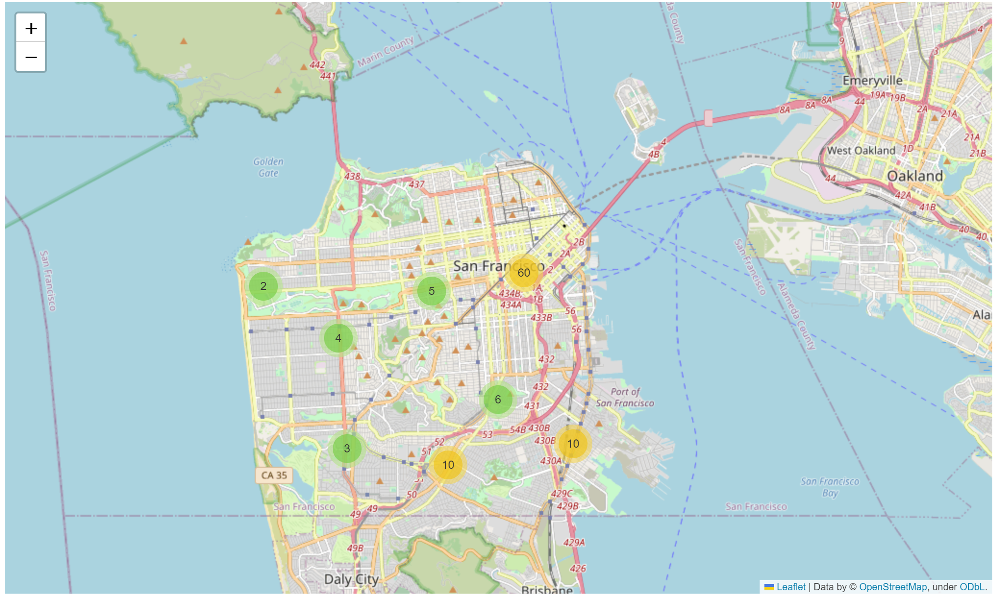
<br>

# 5. Choropleth Maps <a id="8"></a>

In [14]:
# Goal: Create a Choropleth map of the world depicting immigration from various countries to Canada.

# Step 1: Download the Canadian Immigration dataset and read it into a pandas dataframe.

from js import fetch
import io

URL = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud\
/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/Canada.xlsx'
resp = await fetch(URL)
text = io.BytesIO((await resp.arrayBuffer()).to_py())

df_can = pd.read_excel(
    text,
    sheet_name='Canada by Citizenship',
    skiprows=range(20),
    skipfooter=2)

print('Data downloaded and read into a dataframe!')

Data downloaded and read into a dataframe!


In [15]:
## View the first five items in our dataset.
df_can.head()

,Type,Coverage,OdName,AREA,AreaName,REG,RegName,DEV,DevName,1980,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,Immigrants,Foreigners,Afghanistan,935,Asia,5501,Southern Asia,902,Developing regions,16,...,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004
1,Immigrants,Foreigners,Albania,908,Europe,925,Southern Europe,901,Developed regions,1,...,1450,1223,856,702,560,716,561,539,620,603
2,Immigrants,Foreigners,Algeria,903,Africa,912,Northern Africa,902,Developing regions,80,...,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331
3,Immigrants,Foreigners,American Samoa,909,Oceania,957,Polynesia,902,Developing regions,0,...,0,0,1,0,0,0,0,0,0,0
4,Immigrants,Foreigners,Andorra,908,Europe,925,Southern Europe,901,Developed regions,0,...,0,0,1,1,0,0,0,0,1,1


In [16]:
## Print the dimensions of the dataframe
print(df_can.shape)

(195, 43)


In [17]:
# Step 2: Preparing the data to facilitate the creation of the choropleth map. 

## Remove unnecessary columns (eg. REG). 
df_can.drop(['AREA','REG','DEV','Type','Coverage'], axis=1, inplace=True)

## Rename some of the columns to meaningful names. 
df_can.rename(columns={'OdName':'Country', 'AreaName':'Continent','RegName':'Region'}, inplace=True)

## Make all column labels of type string for consistency. 
df_can.columns = list(map(str, df_can.columns))

## Add a new column 'Total' to hold the sum of the number of immigrants over all the years included in the datasest. 
df_can['Total'] = df_can.sum(axis=1)

## Create a list of years to be used for plotting later on.
years = list(map(str, range(1980, 2014)))

## Print the modified dataframe. 
print ('data dimensions:', df_can.shape)

<ipython-input-17-d9923feff21c>:13: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_can['Total'] = df_can.sum(axis=1)


data dimensions: (195, 39)


In [18]:
# Review the changes that have been made to the dataframe.

print('data dimensions:', df_can.shape)
print(df_can.columns)
df_can.head(5)

data dimensions: (195, 39)
Index(['Country', 'Continent', 'Region', 'DevName', '1980', '1981', '1982',
       '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991',
       '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000',
       '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009',
       '2010', '2011', '2012', '2013', 'Total'],
      dtype='object')


,Country,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
0,Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,...,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
1,Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,...,1223,856,702,560,716,561,539,620,603,15699
2,Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,...,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
3,American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,6
4,Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,1,15


In [19]:
# Step 3: Download world countries geojson file to define the areas/boundaries of the countries on the world map.

from js import fetch
import io
import json

URL = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/\
Data%20Files/world_countries.json'
resp = await fetch(URL)
data = io.BytesIO((await resp.arrayBuffer()).to_py())
world_geo = json.load(data)

print('GeoJSON file loaded!')

GeoJSON file loaded!


In [20]:
# Step 4: Set the threshold_scale to be used as the input of the 'threshold_scale' parameter when creating a Choropleth map. 

## Create a numpy array of length 6 with a linear spacing from the minimum total immigration to the maximum total immigration.
threshold_scale = np.linspace(df_can['Total'].min(),
                              df_can['Total'].max(),
                              6, dtype=int)

## Change the numpy array to a list.
threshold_scale = threshold_scale.tolist() 

## Ensure that the last value of the list is greater than the maximum immigration.
threshold_scale[-1] = threshold_scale[-1] + 1 

# Steo 5: Create a plain world map, centered around [0, 0] latitude and longitude values, with an initisal zoom level of 2.
world_map = folium.Map(location=[0, 0], zoom_start=2)

# Step 6: Generate Choropleth map using the total immigration of each country to Canada from 1980 to 2013.
world_map.choropleth(
    geo_data=world_geo,                  ## the GeoJSON file
    data=df_can,                         ## the dataframe containing the data.
    columns=['Country', 'Total'],        ## Select the columns in the dataframe that will be used to create the Choropleth map.
    key_on='feature.properties.name',    ## the key in the GeoJSON file that contains the name of the countries
    threshold_scale=threshold_scale,     ## This allows Folium to determine the scale.
    fill_color='YlOrRd',                 ## Set the colors of the map. 
    fill_opacity=0.7,                    ## Set the opacity of the filled areas on map. 
    line_opacity=0.2,                    ## Set the line opacity.
    legend_name='Immigration to Canada', ## Add a name to the legend.
    reset=True
)

# Step 7: Display the Choropleth map. 
world_map

/lib/python3.10/site-packages/folium/folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


<br>
<br>

### Since GitHub does not display the output of the above code, the .png file of the output is included here. 

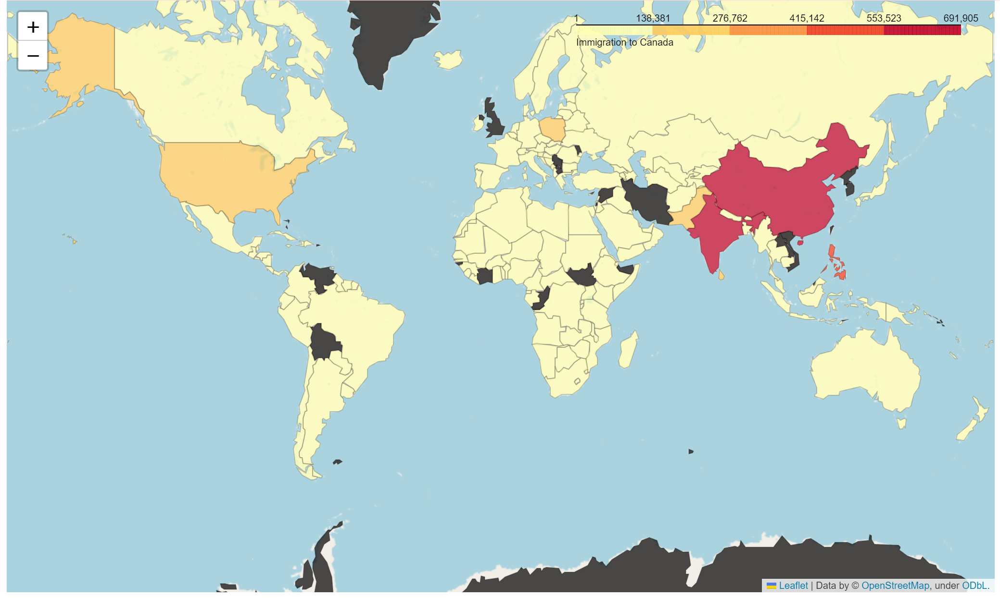
<br>

#### Comment

Per the `Choropleth` map legend, the darker the color of a country and the closer the color to red, the higher the number of immigrants from that country. Accordingly, the highest immigration over the course of 33 years (from 1980 to 2013) was from China, India, and the Philippines (countries in Red), followed by Poland, Pakistan, and the US (countries in yellow-orange.